Laboratorio N°02 - PSeI

---



INTEGRANTES:

*   Baltazar Julca Cristhian
*   Garay Alcántara Alex
*   Gonzales Bañes Ricardo

In [ ]:
!wget -nc /content/piano.wav
!pip install pysoundfile
!pip install bitstring

import numpy as np
import matplotlib.pyplot as plt
import pylab as pl
import time
from IPython import display
plt.style.use(['dark_background'])

In [ ]:
import IPython
IPython.display. Audio ("/content/piano.wav")

**Lectura del Audio del Piano**

Frecuencia de muestreo: 48000 muestras/s
Total de muestras en la señal: 859840 muestras
Duración: 17.913 segundos


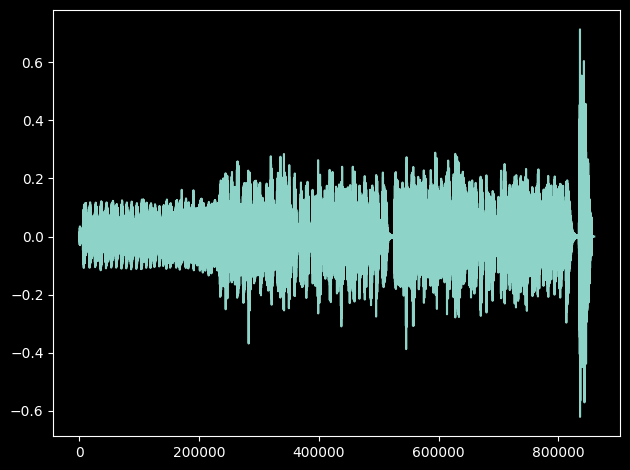

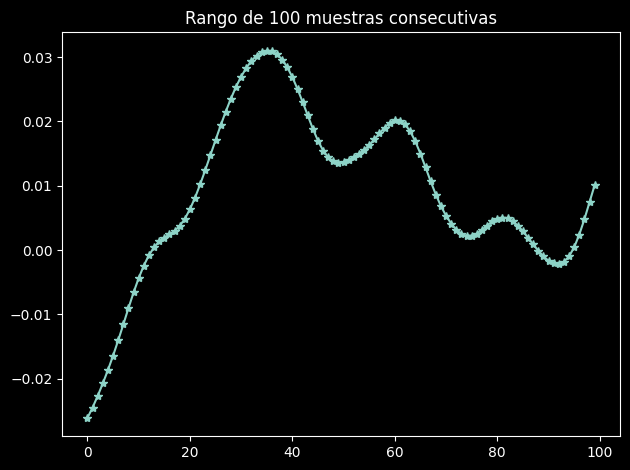

In [ ]:
import soundfile
import matplotlib.pyplot as plt

senial_piano, sampling_rate = soundfile.read("/content/piano.wav")
print(f'Frecuencia de muestreo: {sampling_rate} muestras/s')
print(f'Total de muestras en la señal: {senial_piano.shape[0]} muestras')
print(f'Duración: {round(senial_piano.shape[0] / sampling_rate,3)} segundos')
plt.plot(senial_piano)
plt.tight_layout()
plt.figure()
plt.plot(senial_piano[50000:50100],marker='*')
plt.title("Rango de 100 muestras consecutivas")
plt.tight_layout()

**Librerias adicionales:**

In [ ]:
import numpy as np
import scipy.fft as fourier
import matplotlib.pyplot as plt
import scipy.signal
import scipy.io.wavfile as waves
import ipywidgets as widgets
from matplotlib import animation, patches, rc
import matplotlib as mpl
from IPython.display import YouTubeVideo, HTML, Audio

**Generamos la Señal:**

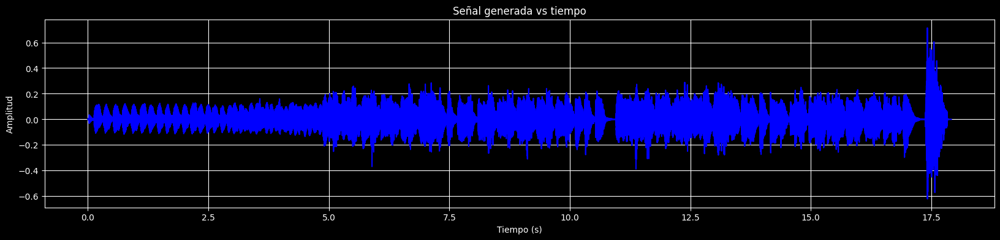

In [ ]:
fm = sampling_rate #Frecuencia de muestreo
t = np.arange(0, len(senial_piano))/fm  #array tiempo
n = len(t) #Longitud de la señal

#senial_piano =...Señal generada


plt.subplots(1,1, figsize=(20,4))

plt.subplot(111)
plt.plot(t,senial_piano,"b")
plt.title("Señal generada vs tiempo")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid()

plt.show()

**Creacion del Kernel Gaussiano:**

In [ ]:
#Creando el kernel
kernel = np.exp(-np.linspace(-2,2,31) **2) #funcion gausiana
print(kernel)
kernel = kernel/sum(kernel)
N= len(senial_piano) #longitud de la señal


[0.01831564 0.03067079 0.04956628 0.07730474 0.1163548  0.16901332
 0.23692776 0.32053052 0.41848631 0.52729242 0.64118039 0.75243216
 0.85214379 0.9313584  0.98237931 1.         0.98237931 0.9313584
 0.85214379 0.75243216 0.64118039 0.52729242 0.41848631 0.32053052
 0.23692776 0.16901332 0.1163548  0.07730474 0.04956628 0.03067079
 0.01831564]


**Mostramos las Señales Creadas:**

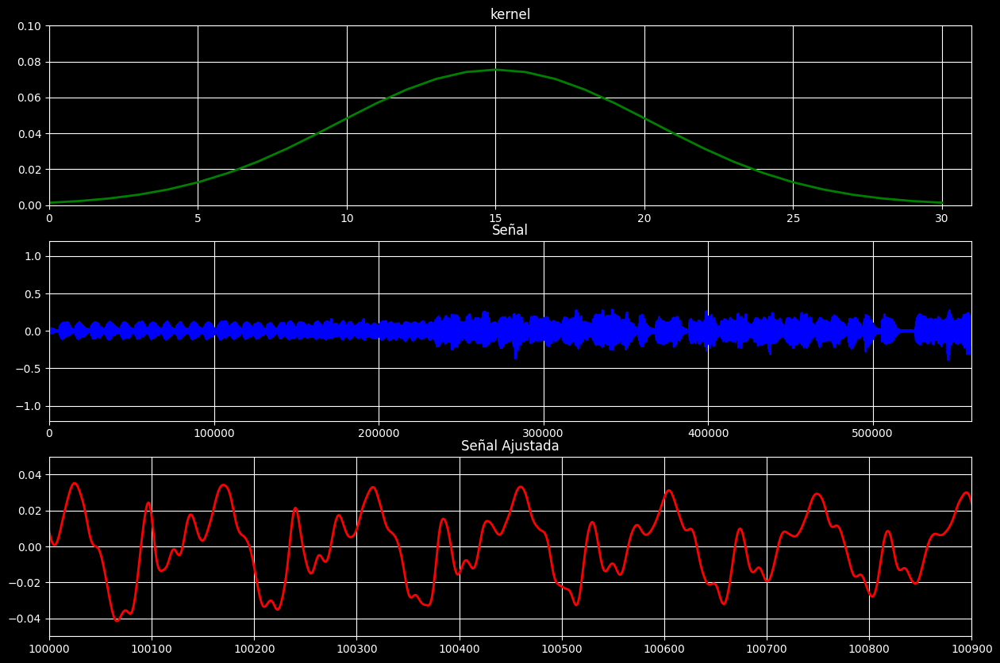

In [ ]:
plt.figure(figsize=(15,10)) #tamaño de la gráfica

#Gráfica del Kernel

plt.subplot(311)
plt.plot(kernel, 'g', linewidth=2)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('kernel')
plt.axis([0, 31, 0,0.1])
plt.grid()

#Gráfica de la señal:

plt.subplot(312)
plt.plot(senial_piano, 'b', linewidth=2,)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('Señal')
plt.axis([0, 560128, -1.2, 1.2])
plt.grid()

#Gráfica de la señal Ajustada en un rango:

plt.subplot(313)
plt.plot(senial_piano, 'r', linewidth=2,)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('Señal Ajustada')
plt.grid()
plt.axis([100000, 100900, -0.05, 0.05])

plt.show()

**Resultado de la convolución**

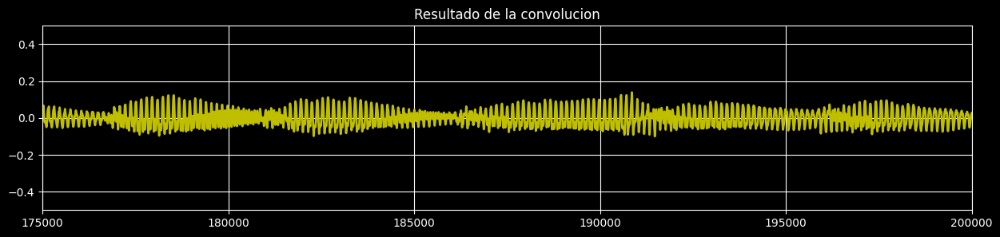

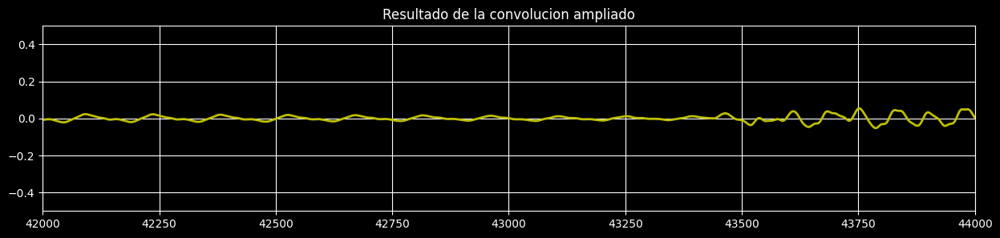

In [ ]:
resultado_convolucion = np.convolve(senial_piano, kernel, 'same') # El 'same indica que el resultado debe ser recortado y tener las mismas dimensiones que la señal original
                                                      # Si se desea el resultado completo se puede usar "full" y no limitar el eje x.

plt.figure(figsize=(15,3))

plt.plot(resultado_convolucion, 'y',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la convolucion')
plt.grid()
plt.axis([175000, 200000, -0.5, 0.5])

plt.figure(figsize=(15,3))

plt.plot(resultado_convolucion, 'y',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la convolucion ampliado')
plt.grid()
plt.axis([42000, 44000, -0.5, 0.5])

plt.show()

**Graficas de comparación**

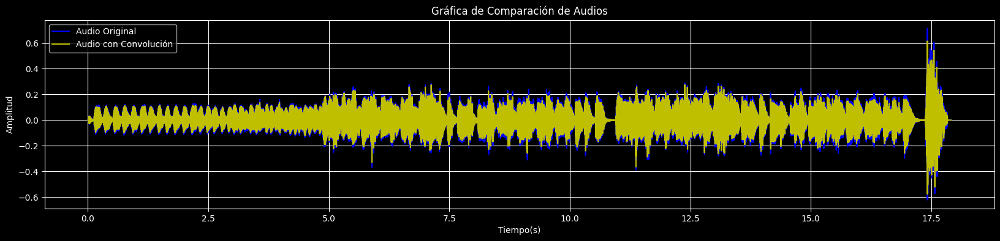

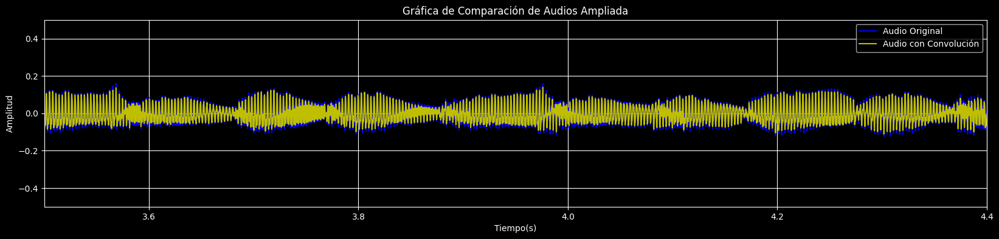

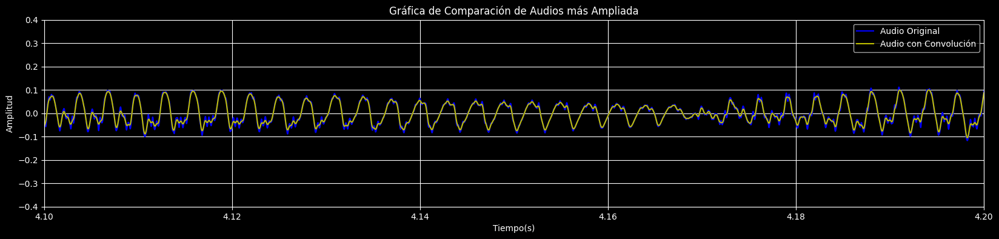

In [ ]:
plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original")
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original")
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([3.5, 4.4, -0.5, 0.5])
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original")
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios más Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([4.1, 4.2, -0.4, 0.4])
plt.grid()
plt.legend()

plt.show()

**Mostramos el audio original y el modificado**

In [ ]:
import IPython
IPython.display. Audio ("/content/piano.wav") # Audio Original

In [ ]:
Audio(resultado_convolucion, rate = fm) # Resultado de Convolución

¿Que efecto sonoro identifica entre el audio original y el modificado?

- Se puede apreciar que en el audio original el sonido se nota con mas agudos o picos mas altos, pero en el audio modificado notamos una suavizacion del sonido de la señal original, especialmente en los pulsos mas cambiantes

**TEST DE COMPROBACION:**

¿Si en el ejercicio se usa la función correlate en vez de convolve que diferencias en la forma y sonoras se tendría en la señal de salida?. Explique.

**Resultado usando correlate:**

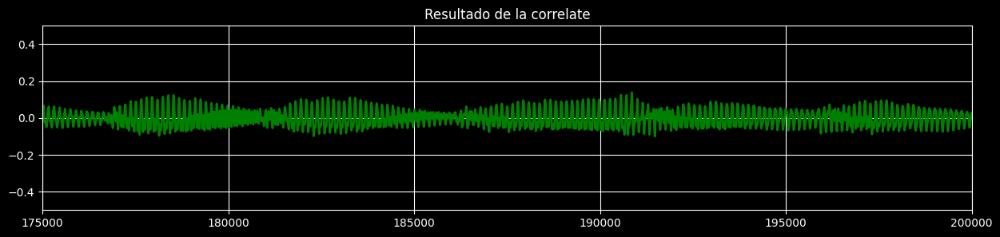

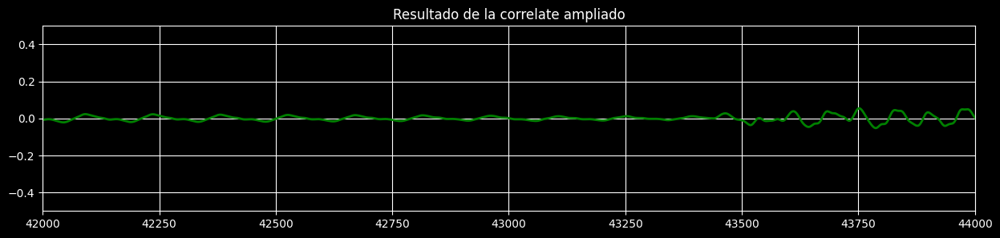

In [ ]:
resultado_correlate = np.correlate(senial_piano, kernel, 'same') # El 'same indica que el resultado debe ser recortado y tener las mismas dimensiones que la señal original
                                                                 #Si se desea el resultado completo se puede usar "full" y no limitar el eje x.

plt.figure(figsize=(15,3))

plt.plot(resultado_correlate, 'g',linewidth=2)
plt.xlim([0,N]) # ajustamos el eje x entre 0 y N
plt.title('Resultado de la correlate')
plt.grid()
plt.axis([175000, 200000, -0.5, 0.5])

plt.figure(figsize=(15,3))

plt.plot(resultado_correlate, 'g',linewidth=2)
plt.xlim([0,N]) #ajustamos el eje x entre 0 y N
plt.title('Resultado de la correlate ampliado')
plt.grid()
plt.axis([42000, 44000, -0.5, 0.5])

plt.show()

**COMPARACIÓN: señal original /convolucion /correlate**

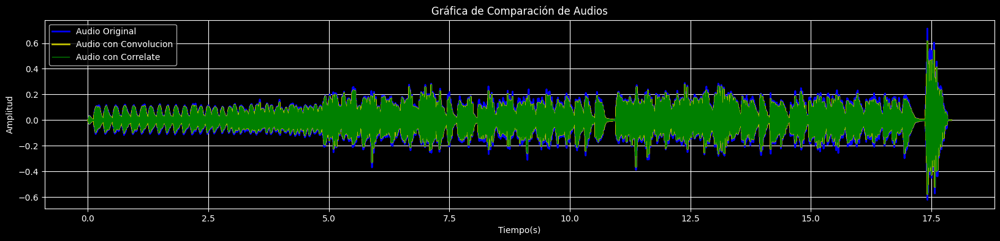

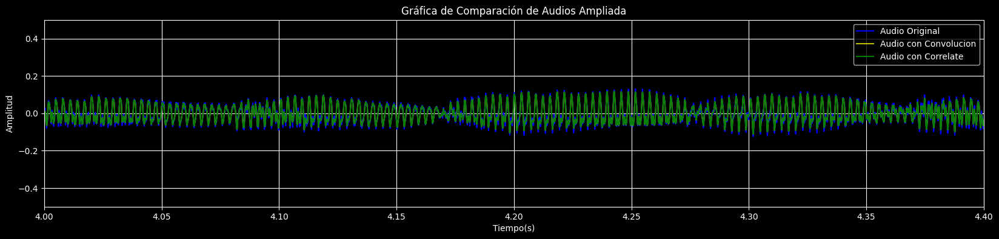

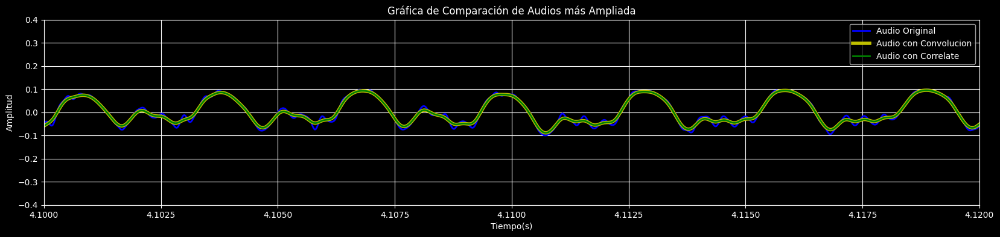

In [ ]:
plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original",linewidth=2)
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolucion",linewidth=2)
plt.plot(t,resultado_correlate,"g",label="Audio con Correlate",linewidth=1)
plt.title("Gráfica de Comparación de Audios")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original")
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolucion")
plt.plot(t,resultado_correlate,"g",label="Audio con Correlate")
plt.title("Gráfica de Comparación de Audios Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([4, 4.4, -0.5, 0.5])
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_piano,"b", label="Audio Original",linewidth=2)
plt.plot(t,resultado_convolucion,"y",label="Audio con Convolucion",linewidth=4)
plt.plot(t,resultado_correlate,"g",label="Audio con Correlate",linewidth=2)
plt.title("Gráfica de Comparación de Audios más Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([4.1, 4.12, -0.4, 0.4])
plt.grid()
plt.legend()

plt.show()

**Audio original:**

In [ ]:
IPython.display. Audio ("/content/piano.wav")

**Audio aplicado convolucion:**

In [ ]:
Audio(resultado_convolucion, rate = fm)

**Audio aplicado correlacion:**

In [ ]:
Audio(resultado_correlate, rate = fm)

Luego de escuchar los audios donde se aplico convolucion y al otro correlacion,pues no se nota mucha la diferencia sonora. Puede ser el caso en que nuestra Señal del piano sea simetrica. Teoricamente se puede decir que si se desea analizar el efecto de un sistema sobre una señal, se utiliza la convolución. Si se desea encontrar patrones o características específicas en una señal, se utiliza la correlación